# MAT281 - Tarea 1

## SVD y Gatitos 

En este ejercicio utilizaremos la descomposición valor singular con tal de comprimir imágenes, si bien hay algoritmos mucho mejores para esto, será un ejercicio muy ilustrativo. 

### Recuerdo

La descomposición SVD de una matriz $A$ de tamaño $m \times n$ posee la siguiente forma 
$$
A = U \Sigma V^H
$$
donde $\Sigma$ es diagonal $m \times n$, mientras que $U$ y $V$ son matrices unitarias $m \times m$ and $n \times n$, respectivamente. Los elementos diagonales de $\Sigma$ son no-negativos y aquellos valores positivos son llamados **valores singulares** de $A$. Como convención los valores singulares se listan en orden decreciente a lo largo de la diagonal. Las columnas de $U$ y $V$ son llamadas **vectores singulares** izquierdos y derechos respectivamente.

PD: Recuerda que $A^H = \bar{A}^\top$, es decir, la matriz traspuesta de la matriz conjugada.

In [1]:
import numpy as np
from scipy import linalg

np.random.seed(42)  # Para reproducibilidad de resultados

Por ejemplo para una matriz de $2 \times 2$:

In [2]:
A = np.array([[0.1, 0.5], [0.4, 0.8]])

eigen_values, eigen_vectors = linalg.eig(A)

#### Ejercicio 1

(5 puntos)

Define la función `svd_validaton` tal que:

1. El _input_ sea un arreglo bidimensional `A` de tamaño $m \times n$.
2. Obtenga la descomposición valor singular de `A`.
3. Retorne `True` o `False` si es que se cumple la igualdad 
$$
A = \sum_{l=1}^{\min(m, n)} \sigma_l \; u_l v_l^H,
$$
donde $\sigma_l$ corresponden a los valores singulares de $A$, mientras que $u_i$ y $v_j$ a las columnas de $U$ y $V$ respectivamente. Hint: Utiliza `np.allclose` con la tolerancia por defecto.

In [3]:
from scipy import linalg

def H(A):
    return A.transpose().conjugate()

def svd_validation(A):
    #Guardé esto para usos futuros
    #
    #if A.shape[0] < A.shape[1]:
    #    flag = True
    #    B = A.transpose()
    #else:
    #    flag = False
    #    B = A
    #m,n = B.shape
    
    #E = np.zeros((m,n))
    #U = np.zeros((m,m))
    #V = np.zeros((n,n))
    #eigen_values, V = linalg.eig(H(B).dot(B))
    #singular_values = eigen_values**(1/2)
    
    #for i in range( singular_values.size ):
    #    E[i,i] = singular_values[i]
    #for k in range(n):
    #    U[:,k] = 1/singular_values[k]*B.dot(V[:,k])
    
    #if flag:
    #    aux = U
    #    U = V
    #    V = aux.transpose()
    #    E = E.transpose()
    #else:
    #    V = V.transpose()
    
    m,n = A.shape
    U, E, V = linalg.svd(A)
    suma = np.zeros([m,n])
    
    for i in range(min([m,n])):
        suma += E[i]*(U[:,i].reshape((m,1)).dot(H(V)[:,i].reshape((1,n))))
        
    return np.allclose(A, suma)

In [4]:
A_test = np.random.randint(100, size=(20, 5))
svd_validation(A_test)

True

### Geometría

Considerar una matriz `A` como un operador lineal tiene una interpretación geométrica muy sencilla, transforma una (hyper)-esfera en una (hyper)-elipse. Por ejemplo, consideremos una esfera unitaria en $\mathbb{R}^2$.

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
def show_circle(circle):
    plt.plot(circle[0, :], circle[1, :])
    plt.axis('image');

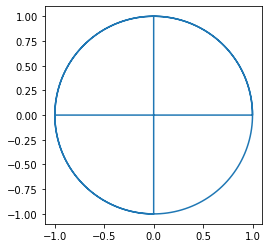

In [7]:
t = np.linspace(0, 3.5 * np.pi , num=300)
l = np.linspace(-1, 1, num=10)
z = np.zeros_like(l)
circle = np.array(
    [
        np.concatenate([l, np.cos(t), z]),
        np.concatenate([z, np.sin(t), l])
    ]
)

show_circle(circle) 

Luego, al utilizar `A` como un operador lineal, es decir $A C$.

In [8]:
print(A)

[[0.1 0.5]
 [0.4 0.8]]


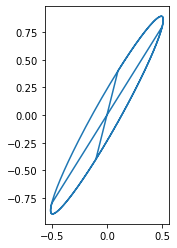

In [9]:
show_circle(A @ circle)

#### Ejercicio 2

(5 puntos)

* Obtén la descomposición SVD de $A$, tal que $A = U \Sigma V^H$.
* Grafica el resultado de aplicar los siguientes operadores lineales a la circunferencia unitaria:
    - $U$
    - $\Sigma$
    - $V^H$
* Explica con tus palabras la transformación de la circunferencia unitaria luego de aplicar los operadores anteriores, ¿Influye en algo que $U$ y $V$ sean unitarias?
* ¿Qué relación tienen los operadores anteriores respecto a aplicar el operador lineal $A$?

In [10]:
u, s, vh = linalg.svd(A)

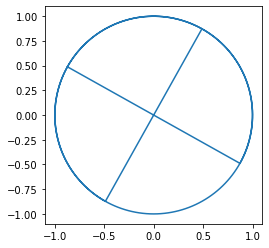

In [11]:
show_circle(u @ circle)

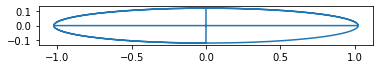

In [12]:
show_circle(np.diag(s) @ circle)

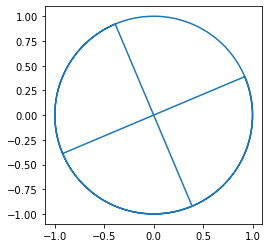

In [13]:
show_circle(vh @ circle)

__Respuesta:__ 
```
    - Los operadores corresponden a transformaciones en la forma de la circunferencia. Para $U, V$, estas transformaciones corresponden a rotaciones, mientras que para $\sigma$ se tiene que la circunferencia cambió de tamaño, en este caso, se comprimió.
    - Como $U, V$ son unitarias, entonces la circunferencia mantuvo su tamaño.```

__Respuesta:__ $A$ es una composición de transformaciones matriciales. En este caso, aplicar $A$ a la circunferencia es equivalente a aplicar en orden $V^t$, $\sigma$ y $U$.

### Aproximación Rango Menor

Existen muchas maneras de expresar una matriz como una suma de matrices de menor rango, por ejemplo:

$$
\begin{bmatrix}
a & b \\
c & d 
\end{bmatrix}
= 
\begin{bmatrix}
a & 0 \\ 0 & 0  
\end{bmatrix}
+ 
\begin{bmatrix}
0 & b \\ 0 & 0 
\end{bmatrix}
+ 
\begin{bmatrix}
0 & 0 \\ c & 0 
\end{bmatrix}
+
\begin{bmatrix}
0 & 0 \\ 0 & d 
\end{bmatrix}.
$$

Cada una de las matrices del lado derecho pueden tener rango a lo más 1.

En el primer ejercicio demostraste que la descomposición SVD $A$ puede ser expresada como una suma de matrices. Sin embargo, cada una de estas matrices tiene rango 1! Esto pues cada una de estas matrices se forma a partir de los productos externos entre los vectores $u_l$ y $v_l$, es decir $u_l v_l^H$.

La pregunta natural es:

_¿Cómo obtener una buena aproximación de $A$ utilizando matrices de rango muy bajo?_

Bueno, aquí va un teorema.

__Teorema 1:__



Sea $A$ matriz de tamaño $m \times n$. Para cualquier $0 \le \ell \le r = \text{rank}(A)$, se define la matriz 
$$
A_\ell = \sum_{j=1}^{\ell} \sigma_j u_j v_j^*,
$$
utilizando los valores singulares $\sigma_j$ y los vectores singulares (izquierdos y derechos) $u_j, v_j$ de $A$,  i.e., $A_\ell$ se compone de la suma de los primeros $\ell$ términos de la descomposición SVD escrita como una suma de productor externos. Luego, el mínimo de  $\| A - B \|_F$ sobre todas las matrices $B$ de tamaño $m \times n$ y rango no mayor a $\ell$ se obtiene por $\| A - A_\ell \|_F$ y el mínimo que se alcanza es  $(\sigma_{\ell+1}^2 + \cdots + \sigma_r^2)^{1/2}$.

Recuerda que la norma de Frobenius se define como

$$
\| A \|_F = \bigg( \sum_{i, j} |A_{ij}|^2 \bigg)^{1/2}.
$$

Motivaremos el ejercicio utilizando imágenes en escala de grises ya que es muy intuitivo, fácil de ver y se puede considerar que la imagen es una matriz.

In [14]:
from pathlib import Path
from PIL import Image

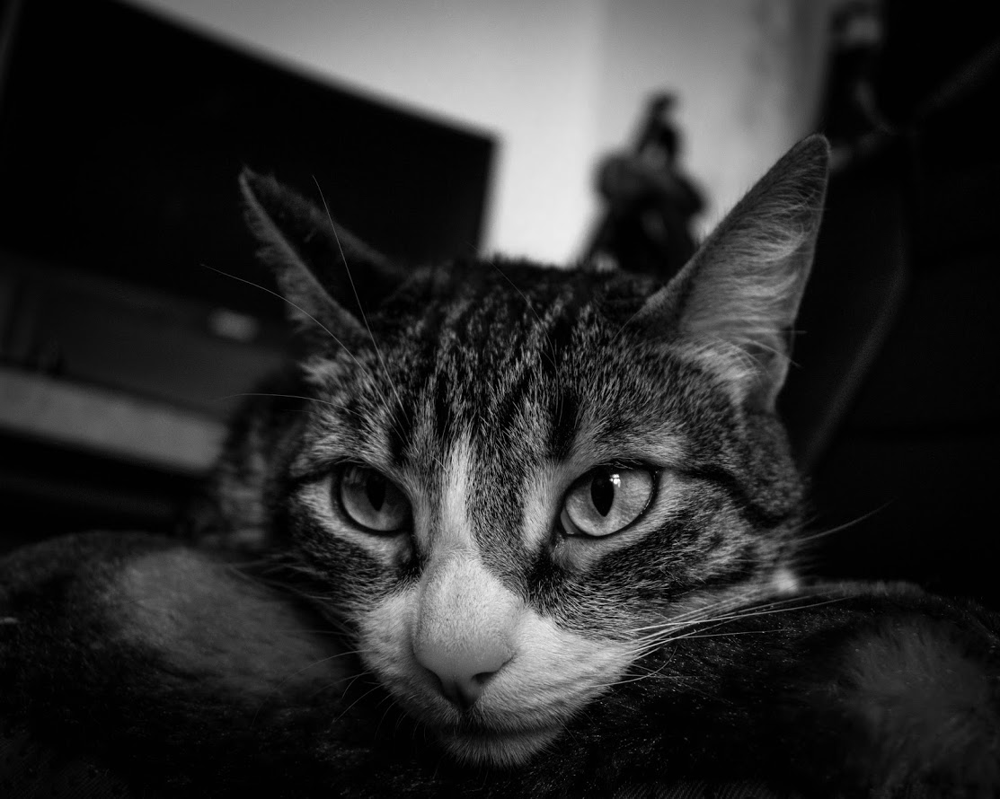

In [15]:
# Utilizaremos una foto de una de mis gatitas c:
cat = Image.open(Path().resolve().parent / "images" / "coyoya.jpg").convert('L')
cat

Para convertirla en un numpy array basta con:

In [16]:
cat_np = np.array(cat)
print(cat_np.shape)

(890, 1113)


#### Ejercicio 3

(10 puntos)

Define la función `low_rank_svd_approximation` tal que:

* Los inputs sean $A$ (la imagen convertida un `np.array` de dimensión 2) y un valor entero $\ell$ que represente la cantidad de términos a sumar de la despomposición SVD (respecto al teorema anterior).
* Retorne la aproximación $A_\ell$
* Imprima el error de la aproximación utilizando la norma de Frobenius.

Luego prueba tu función y observa la imagen con distintos valores de $\ell$.

In [17]:
def frobenius(A):
    return sum((sum(A**2)))**(1/2)

def low_rank_svd_approximation(A, l):
    m,n = A.shape
    U, E, V = linalg.svd(A)
    suma = np.zeros([m,n])
    
    for i in range(l):
        suma += E[i]*(U[:,i].reshape((m,1)).dot(H(V)[:,i].reshape((1,n))))
    
    print(f'Error de aproximación: {round(frobenius(A-suma)/frobenius(A),2)}')
    return suma

Error de aproximación: 42.46


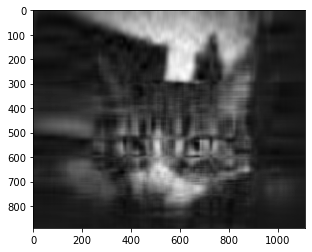

In [18]:
cat10 = low_rank_svd_approximation(cat_np, l=10)
plt.imshow(cat10, cmap='gray');

Error de aproximación: 21.55


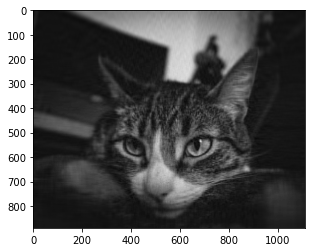

In [19]:
cat50 = low_rank_svd_approximation(cat_np, l=50)
plt.imshow(cat50, cmap='gray');

#### Ejercicio 4

(15 puntos)

En el ejercicio anterior fijaste un rango máximo y obtuviste la aproximación, sin embargo, en otro contexto, te gustaría fijar una tolerancia de error y obtener la mejor aproximación.

Define la función `low_rank_svd_tol_approximation` tal que:

* Los inputs sean $A$ (la imagen convertida un `np.array` de dimensión 2) y $\varepsilon$ (tolerancia relativa) tal que
$$
\left(\frac{\sigma_{\ell+1}^2 + \cdots + \sigma_r^2}{\sigma_1^2 + \cdots + \sigma_r^2}\right)^{1/2} \le \varepsilon.
$$
* Imprima $\ell(\varepsilon)$, es decir, el mayor rango aproximado de $A$ tal que el error de aproximación sea a lo más $\varepsilon$.
* Retorne la aproximación $A_{\ell(\varepsilon)}$

Luego prueba tu función y observa la imagen con distintos valores de $\varepsilon$.

In [20]:
def get_singular_sum(E, i):
    return (sum(E[i+1:]**2) / sum(E**2))**(1/2)

def low_rank_svd_tol_approximation(A, tol):
    m,n = A.shape
    U, E, V = linalg.svd(A)
    suma = np.zeros([m,n])
    
    for i in range(min([m,n])):
        
        suma += E[i]*(U[:,i].reshape((m,1)).dot(H(V)[:,i].reshape((1,n))))
        
        if get_singular_sum(E,i) <= tol:
            print(f'Rango máximo: {i}')
            return suma

Rango máximo: 63


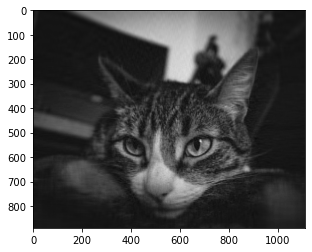

In [21]:
cat_e1 = low_rank_svd_tol_approximation(cat_np, tol=1.e-1)
plt.imshow(cat_e1, cmap='gray');

Rango máximo: 456


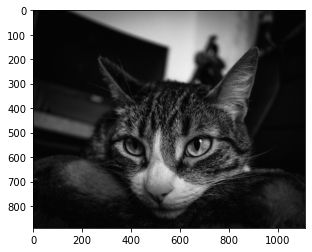

In [22]:
cat_e2 = low_rank_svd_tol_approximation(cat_np, tol=1.e-2)
plt.imshow(cat_e2, cmap='gray');

#### Ejercicio 5

(5 puntos)

Utilizando alguna imagen de tu preferencia utiliza ambas

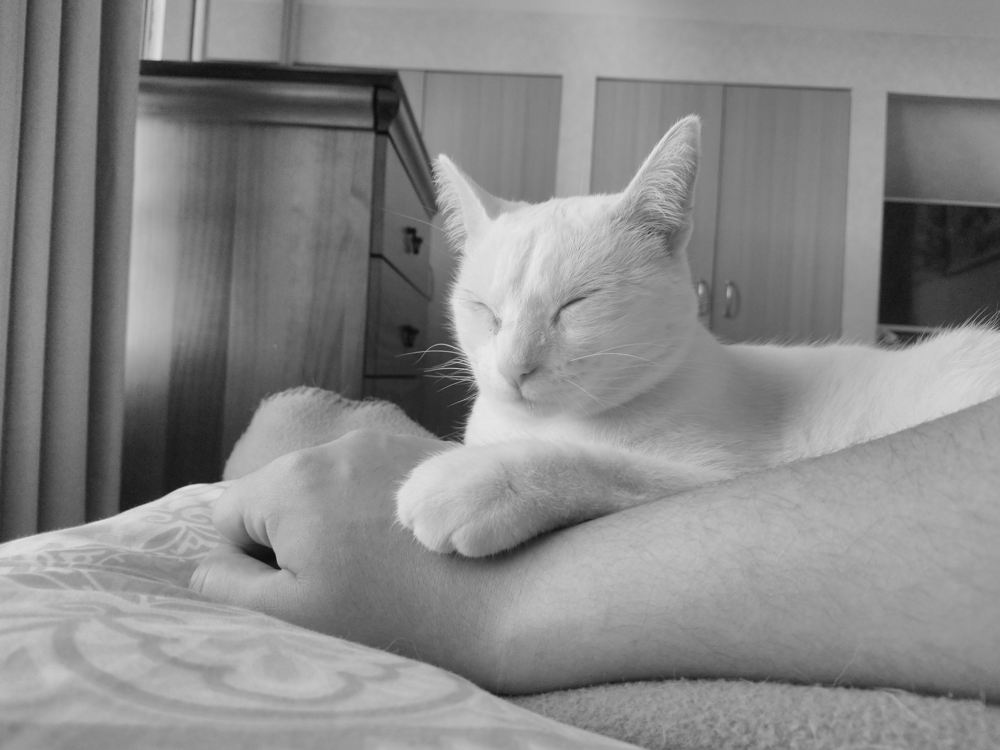

In [23]:
your_img_name = 'malva.jpg'
your_img = Image.open(Path().resolve().parent / "images" / your_img_name ).convert('L')
your_img

In [24]:
your_img_np = np.array(your_img)
print(your_img_np.shape)

(4144, 5520)


Error de aproximación: 72.18


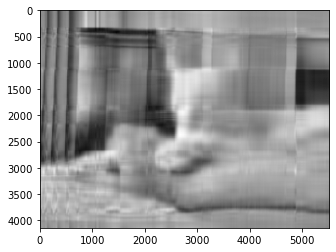

In [25]:
your_img10 = low_rank_svd_approximation(your_img_np, l=10)
plt.imshow(your_img10, cmap='gray');

Error de aproximación: 50.31


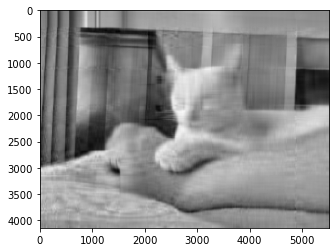

In [26]:
your_img50 = low_rank_svd_approximation(your_img_np, l=20)
plt.imshow(your_img50, cmap='gray');

Rango máximo: 8


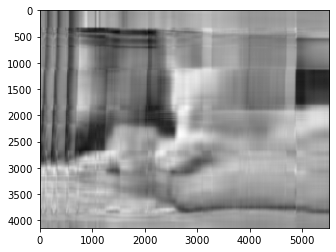

In [27]:
your_img_e1 = low_rank_svd_tol_approximation(your_img_np, tol=1.e-1)
plt.imshow(your_img_e1, cmap='gray');

Rango máximo: 1777


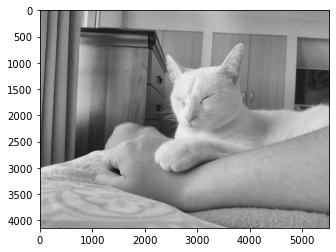

In [28]:
your_img_e2 = low_rank_svd_tol_approximation(your_img_np, tol=1.e-2)
plt.imshow(your_img_e2, cmap='gray');

__Pregunta:__ ¿Será una manera útil de comprimir imágenes en el disco duro o crees que existen otras formas más eficientes?

__Respuesta:__ 
```Deben existir muchas más eficientes, puesto que para la fotografía de mi gata el tiempo de compresión es excesivo. Para una tolerancia de 0.01, se tiene que mi imagen se comprime en 2min 30s aproximadamente, lo cual es bastante, considerando que mi imagen pesa apenas 9MB (y en general, se suelen utilizar compresión de imagenes para archivos bastante grandes).```

## COVID-19 en Chile

### *¿Cuál es el panorama actual de Chile frente a la pandemia de COVID-19?*

In [29]:
import pandas as pd
from datetime import date

#### Ejercicio 6

(25 puntos)

Se ha hablado mucho últimamente que Magallanes es una región crítica en cuanto a casos confirmados de COVID-19. Este ejercicio busca constatar a través de los datos aquellas aseveraciones con un indicador siemple pero que parece ser efectivo que bautizaremos como _tasa promedio de casos nuevos_, definida como el promedio de nuevos casos cada cien mil habitantes para un umbral de tiempo determinado.

Utiliza el dataframe `covid_comunas` para obtener el dataframe `covid_tasa_promedio_nuevos` que posee las columnas `region`, `comuna`, `promedio_casos_nuevos`, `poblacion` y `tasa_promedio_casos_nuevos` considerando el umbral de tiempo es entre el 1 y 11 de octubre del año 2020.

Para ello considera lo siguiente:

* No consideres registros que tengan código de comuna nulo.
* Rellena todos los registros de casos totales nulos por cero.
* Considera utilizar `melt` u otro método similar para apilar las columnas de fechas particulares en solo dos columnas, `fecha` y `casos_totales`.
* Define la columna `casos_nuevos` como la diferencia entre dos registros consecutivos para una misma comuna
    - No olvides ordenar por fecha
    - El primer registro de cada comuna debe ser nulo.
    - Considera utilizar el método `transform`.
* Filtra por el umbral de tiempo dado.
* Agrupa por región-comuna y luego define la columna `promedio_casos_nuevos` como el promedio de la columna `casos_nuevos`.
* En caso que hayas _dropeado_ la columna `poblacion` la puedes volver a agregar utilizando `merge` u otro método apropiado. Se asume que la población no cambia durante el tiempo.
* Asigna la columna `tasa_promedio_casos_nuevos` como la cantidad promedio de casos nuevos por cada cien mil habitantes.
* Ordena el dataframe resultante por `tasa_promedio_casos_nuevos` de manera descendente.

Información del dataset: [aquí](https://github.com/MinCiencia/Datos-COVID19/tree/master/output/producto1).

In [30]:
covid_comunas = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto1/Covid-19.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
covid_comunas.head()

,region,codigo_region,comuna,codigo_comuna,poblacion,2020-03-30,2020-04-01,2020-04-03,2020-04-06,2020-04-08,...,2020-10-02,2020-10-05,2020-10-09,2020-10-12,2020-10-16,2020-10-19,2020-10-24,2020-10-26,2020-10-30,tasa
0,Arica y Parinacota,15,Arica,15101.0,247552.0,6.0,6.0,12.0,41.0,63.0,...,8597.0,8772.0,8996.0,9138.0,9343.0,9472.0,9679.0,9763.0,9888.0,3994.3
1,Arica y Parinacota,15,Camarones,15102.0,1233.0,0.0,0.0,0.0,0.0,0.0,...,27.0,28.0,28.0,28.0,28.0,28.0,28.0,28.0,28.0,2270.9
2,Arica y Parinacota,15,General Lagos,15202.0,810.0,0.0,0.0,0.0,0.0,0.0,...,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,7901.2
3,Arica y Parinacota,15,Putre,15201.0,2515.0,0.0,0.0,0.0,0.0,0.0,...,67.0,70.0,70.0,70.0,70.0,70.0,71.0,72.0,72.0,2862.8
4,Arica y Parinacota,15,Desconocido Arica y Parinacota,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.0,36.0,36.0,40.0,43.0,43.0,43.0,44.0,36.0,NaN


In [31]:
from datetime import datetime

start_date = '10/2/2020'
end_date = '10/11/2020'

# Crear lista de fechas por buscar a partir de las fechas de inicio y término
search_dates = pd.date_range(start=start_date, end=end_date).to_list()
for i in range(len(search_dates)):
    search_dates[i] = search_dates[i].strftime('%Y-%m-%d')

# Crear lista de columnas correspondiente de fechas
dates = [date for date in covid_comunas.columns.to_list() if date not in ['region', 'codigo_region', 'comuna', 'codigo_comuna', 'poblacion', 'tasa']]

In [32]:
# Se eliminan entradas donde 'codigo_comuna' es nulo
# Se reemplazan NaN por cero en el resto de columnas para todas las entradas
# Se utiliza melt para pasar fechas como valores de cada entrada

covid_tasa_promedio_nuevos = (
    pd.melt(covid_comunas.dropna(subset=['codigo_comuna']).fillna(0), 
        id_vars = ['region', 'comuna', 'poblacion'], 
        value_vars = dates, 
        var_name = 'fecha',
        value_name = 'casos_totales'
        )
    )

# Se define casos_nuevos (se llamará 'promedio_casos_nuevos' para mantener el nombre posteriormente)
covid_tasa_promedio_nuevos['promedio_casos_nuevos'] =  covid_tasa_promedio_nuevos.groupby('comuna')['casos_totales'].diff()

# Filtrar por fechas a buscar
covid_tasa_promedio_nuevos = covid_tasa_promedio_nuevos[covid_tasa_promedio_nuevos['fecha'].isin(search_dates)]

# Agrupar por region y comuna, promediando casos_totales
covid_tasa_promedio_nuevos = covid_tasa_promedio_nuevos.groupby(['region', 'comuna']).apply(lambda s: s.mean()).reset_index().drop(columns = ['casos_totales'])

# Crear columna 'tasa_promedio_casos_nuevos'
covid_tasa_promedio_nuevos['tasa_promedio_casos_nuevos'] = (
    covid_tasa_promedio_nuevos['promedio_casos_nuevos'] / covid_tasa_promedio_nuevos['poblacion'] * 100000
)
# Ordenar dataframe por 'tasa_promedio_casos_nuevos'
covid_tasa_promedio_nuevos = covid_tasa_promedio_nuevos.sort_values(by='tasa_promedio_casos_nuevos', ascending=False)

In [33]:
covid_tasa_promedio_nuevos

,region,comuna,poblacion,promedio_casos_nuevos,tasa_promedio_casos_nuevos
163,Magallanes,Timaukel,282.0,3.333333,1182.033097
162,Magallanes,San Gregorio,681.0,4.000000,587.371512
156,Magallanes,Laguna Blanca,264.0,1.333333,505.050505
158,Magallanes,Porvenir,7323.0,34.333333,468.842460
160,Magallanes,Punta Arenas,141984.0,631.333333,444.651040
...,...,...,...,...,...
61,Aysén,OHiggins,661.0,0.000000,0.000000
109,Coquimbo,Rio Hurtado,4372.0,0.000000,0.000000
57,Aysén,Cochrane,3685.0,0.000000,0.000000
154,Magallanes,Antartica,137.0,0.000000,0.000000


__Pregunta:__ ¿Qué puedes observar respecto a las comunas que tienen mayor Tasa Promedio de Casos Nuevos?

__Respuesta:__ ```La región de Magallanes posee las comunas con las mayores tasa promedio de casos nuevos por cada cien mil habitantes. Esto muestra la gravedad de la pandemia en aquella región.```

#### Ejercicio 7

(15 puntos)

¿Hay correlación entre la cantidad de exámenes PCR y los casos confirmados en cada comuna?


Información del dataset: [aquí](https://github.com/MinCiencia/Datos-COVID19/tree/master/output/producto7).

In [34]:
covid_pcr = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto7/PCR.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
covid_pcr.head()

,region,codigo_region,poblacion,2020-04-09,2020-04-10,2020-04-11,2020-04-12,2020-04-13,2020-04-14,2020-04-15,...,2020-10-23,2020-10-24,2020-10-25,2020-10-26,2020-10-27,2020-10-28,2020-10-29,2020-10-30,2020-10-31,2020-11-01
0,Arica y Parinacota,15,252110,70.0,NaN,93.0,103.0,NaN,93.0,24.0,...,794,738,737,832,542,343,706,777,1058,1025
1,Tarapacá,1,382773,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,972,932,1046,1044,796,714,694,946,1752,906
2,Antofagasta,2,691854,182.0,128.0,107.0,175.0,103.0,95.0,117.0,...,1571,1890,2239,3825,1749,1354,1858,1238,1906,2549
3,Atacama,3,314709,57.0,52.0,60.0,25.0,20.0,22.0,25.0,...,792,838,1020,939,563,340,237,838,863,781
4,Coquimbo,4,836096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1008,1128,1057,1026,473,1503,1050,1125,1351,1245


Obtén el dataframe `covid_pcr_melt` utilizando `covid_pcr` tal que:

* Tenga las columnas `region`, `fecha` y `nm_pcr`.
* `fecha` sea del tipo `datetime64`.
* `nm_pcr` sea el número de PCR realizados y rellena los valores nulos por cero.

In [35]:
covid_pcr_melt = (
    pd.melt(covid_pcr, 
            id_vars = ['region', 'poblacion'],
            value_vars = [date for date in covid_pcr.columns.to_list() if date not in ['region', 'codigo_region', 'poblacion']],
            var_name = 'fecha',
            value_name = 'nm_pcr')
    .fillna(0)
    .astype({'fecha': 'datetime64'})
)
covid_pcr_melt.head()

,region,poblacion,fecha,nm_pcr
0,Arica y Parinacota,252110,2020-04-09,70.0
1,Tarapacá,382773,2020-04-09,0.0
2,Antofagasta,691854,2020-04-09,182.0
3,Atacama,314709,2020-04-09,57.0
4,Coquimbo,836096,2020-04-09,0.0


Obtén el dataframe `covid_casos_melt` utilizando `covid_comunas` tal que:

* Tenga las columnas `region`, `fecha` y `casos_totales`.
* Rellena los valores nulos con cero.
* `fecha` sea del tipo `datetime64`.
* `casos_totales` sea la cantidad de casos totales por región y fecha.

In [36]:
covid_casos_melt = (
    pd.melt(covid_comunas.fillna(0), 
            id_vars = ['region', 'comuna'],
            value_vars = [date for date in covid_comunas.columns.to_list() if date not in ['region', 'codigo_region', 'comuna', 'codigo_comuna', 'poblacion', 'tasa']],
            var_name = 'fecha',
            value_name = 'casos_totales')
    .astype({'fecha': 'datetime64'})
)

covid_casos_melt = covid_casos_melt.groupby(['region', 'fecha']).agg({'casos_totales': 'sum'}).reset_index()

covid_casos_melt.head()

,region,fecha,casos_totales
0,Antofagasta,2020-03-30,29.0
1,Antofagasta,2020-04-01,32.0
2,Antofagasta,2020-04-03,49.0
3,Antofagasta,2020-04-06,65.0
4,Antofagasta,2020-04-08,72.0


Finalmente, obtén la serie `covid_corr_casos_pcr` de la siguiente manera:

* Une `covid_pcr_melt` y `covid_casos_melt` a través de _merge_, utilizando la región y la fecha como llave, además conserva todos los registros (tanto derecha como izquierda).
* Rellena los números de PCR con el valor cero.
* Haz un `ffill` a los casos totales.
* Agrupa por región y obtén la correlación entre `nm_pcr` y `casos_totales`.
* Ordena los valores ascendentemente.

In [37]:
covid_corr_casos_pcr = covid_pcr_melt.merge(covid_casos_melt, how = 'outer', on = ['region', 'fecha'])
covid_corr_casos_pcr['nm_pcr'] = covid_corr_casos_pcr['nm_pcr'].fillna(0)
covid_corr_casos_pcr.fillna(method='ffill', inplace=True)
# Algunos datos poseian NaN al inicio, por tanto, usé backward fill para reemplazarlos.
covid_corr_casos_pcr.fillna(method='bfill', inplace=True)

covid_corr_casos_pcr_a = covid_corr_casos_pcr.groupby('region')[['nm_pcr','casos_totales']].corr().iloc[0::2,-1].to_frame().reset_index()
covid_corr_casos_pcr_a = covid_corr_casos_pcr_a.drop(columns=['level_1']).rename(columns={'casos_totales':'corr'}).sort_values(by='corr', ascending=False)
covid_corr_casos_pcr_a

,region,corr
1,Araucanía,0.840644
2,Arica y Parinacota,0.792667
6,Coquimbo,0.753603
7,Los Lagos,0.750294
15,Ñuble,0.724370
8,Los Ríos,0.716409
13,Tarapacá,0.695405
10,Maule,0.676758
9,Magallanes,0.667597
12,O’Higgins,0.658869


__Pregunta:__ ¿Qué puedes inferir del análisis anterior? ¿Se condice con tu sentido común?

__Respuesta:__ ```En Araucanía o Arica, es más común que el test PCR salga positivo, a diferencia de otras regiones, como Santiago o Valparaiso, el cual uno imagina por la concentración de población que ocurra más en las urbes más grandes.
    ```

#### Ejercicio 8

(10 puntos)

Propón y responde una pregunta que puedas resolver analizando dos o más conjuntos de datos del repositorio oficial de datos COVID-19 del Ministerio de Ciencia, Tecnología e Innovación de Chile ([link](https://github.com/MinCiencia/Datos-COVID19)).

Se evaluará originalidad, análisis de datos, calidad de la pregunta y respuesta.

__Pregunta:__ ¿Cómo ha evolucionado la tasa de mortalidad entre los distintos rangos etarios a lo largo de la pandemia?

In [38]:
fallecidos_etario = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto10/FallecidosEtario.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
fallecidos_etario.head()

,grupo_de_edad,2020-04-09,2020-04-10,2020-04-11,2020-04-12,2020-04-13,2020-04-14,2020-04-15,2020-04-16,2020-04-17,...,2020-10-23,2020-10-24,2020-10-25,2020-10-26,2020-10-27,2020-10-28,2020-10-29,2020-10-30,2020-10-31,2020-11-01
0,<=39,2,2,3,3,3,3,3,3,4,...,310,310,311,311,313,313,314,315,317,317
1,40-49,1,2,2,2,2,2,2,2,2,...,467,469,469,472,473,473,477,480,483,484
2,50-59,1,2,2,3,3,5,5,6,8,...,1398,1404,1409,1414,1415,1415,1423,1425,1431,1436
3,60-69,9,10,12,12,12,12,12,14,16,...,2925,2943,2957,2966,2971,2973,2994,3005,3013,3023
4,70-79,21,22,24,28,29,30,31,32,36,...,3898,3906,3915,3934,3942,3943,3973,3981,3996,4010


In [39]:
fallecidos_melt_etario = (
    pd.melt(fallecidos_etario, 
            id_vars = ['grupo_de_edad'],
            value_vars =aquí [date for date in fallecidos_etario.columns.to_list() if date not in ['grupo_de_edad']],
            var_name = 'fecha',
            value_name = 'fallecidos')
)

fallecidos_melt_etario = fallecidos_melt_etario.replace({'grupo_de_edad':{'80-89': '>=80', '>=90': '>=80'}})
fallecidos_melt_etario = fallecidos_melt_etario.groupby(['grupo_de_edad','fecha']).sum()

fallecidos_melt_etario

fallecidos
grupo_de_edad fecha                 
40-49         2020-04-09           1
              2020-04-10           2
              2020-04-11           2
              2020-04-12           2
              2020-04-13           2
...                              ...
>=80          2020-10-28        4915
              2020-10-29        4937
              2020-10-30        4952
              2020-10-31        4967
              2020-11-01        4977

[1242 rows x 1 columns]

In [40]:
casos_etario = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto16/CasosGeneroEtario.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
casos_etario.head()

,grupo_de_edad,sexo,2020-03-25,2020-03-26,2020-03-27,2020-03-28,2020-03-29,2020-03-30,2020-03-31,2020-04-01,...,2020-09-28,2020-10-02,2020-10-05,2020-10-09,2020-10-12,2020-10-16,2020-10-19,2020-10-24,2020-10-26,2020-10-30
0,00 - 04 años,M,4,5,5,5,5,5,6,7,...,5403,5552,5552,5733,5823,5913,6003,6143,6196,6290
1,05 - 09 años,M,2,2,2,4,4,4,4,7,...,4644,4762,4762,4996,5075,5175,5258,5384,5429,5535
2,10 - 14 años,M,7,8,8,10,10,10,10,12,...,5298,5451,5451,5674,5776,5880,5987,6142,6197,6300
3,15 - 19 años,M,8,9,13,16,17,18,22,26,...,8535,8727,8727,9161,9319,9486,9619,9842,9942,10076
4,20 - 24 años,M,25,32,35,46,52,58,64,72,...,20310,20648,20648,21188,21440,21703,21929,22273,22430,22706


In [41]:
def interval_to_interval(i):
    if i == 80:
        return '80 y más años'
    else:
        return f'{i:0>2} - {i+4:0>2} años'
    
def age_to_interval(i):
    if i <= 39:
        return '<=39'
    elif 40 <= i <= 49:
        return '40-49'
    elif 50 <= i <= 59:
        return '50-59'
    elif 60 <= i <= 69:
        return '60-69'
    elif 70 <= i <= 79:
        return '70-79'
    else:
        return '>=80'
    
replace_dict = {
    'grupo_de_edad': {interval_to_interval(i): age_to_interval(i) for i in range(0,81,5)}
}

casos_melt_etario = (
    pd.melt(casos_etario, 
            id_vars = ['grupo_de_edad', 'sexo'],
            value_vars = [date for date in casos_etario.columns.to_list() if date not in ['grupo_de_edad', 'sexo']],
            var_name = 'fecha',
            value_name = 'casos_totales')
)

casos_melt_etario = casos_melt_etario.replace(replace_dict)
casos_melt_etario = casos_melt_etario.groupby(['fecha','grupo_de_edad']).sum()

casos_melt_etario

casos_totales
fecha      grupo_de_edad               
2020-03-25 40-49                    220
           50-59                    119
           60-69                     69
           70-79                     38
           <=39                     558
...                                 ...
2020-10-30 50-59                  84923
           60-69                  50348
           70-79                  25373
           <=39                  292757
           >=80                   15953

[528 rows x 1 columns]

In [42]:
last_day_month = {
    '2020-04-28': '2020-04',
    '2020-05-29': '2020-05', 
    '2020-06-28': '2020-06',
    '2020-07-31': '2020-07', 
    '2020-08-31': '2020-08', 
    '2020-09-28': '2020-09',
    '2020-10-30': '2020-10'
    }

por_etario = casos_melt_etario.merge(fallecidos_melt_etario, how = 'inner', on = ['grupo_de_edad','fecha']).reset_index()
por_etario = por_etario[por_etario['fecha'].isin(last_day_month.keys())].replace({'fecha': last_day_month}).rename(columns={'fecha': 'mes'})
por_etario['%fallecidos por casos'] = round(100*por_etario['fallecidos'] / por_etario['casos_totales'],2)
por_etario = por_etario.pivot(index='mes', columns='grupo_de_edad', values=['%fallecidos por casos'])

por_etario

%fallecidos por casos                                
grupo_de_edad                 40-49 50-59 60-69  70-79  <=39   >=80
mes                                                                
2020-04                        0.31  0.76  2.90   9.04  0.08  19.57
2020-05                        0.29  0.70  2.30   7.86  0.04  15.60
2020-06                        0.37  1.21  4.67  13.33  0.08  25.38
2020-07                        0.51  1.68  5.99  15.81  0.11  30.71
2020-08                        0.52  1.70  6.04  15.95  0.11  30.99
2020-09                        0.52  1.67  5.94  15.89  0.11  30.84
2020-10                        0.52  1.68  5.97  15.69  0.11  31.04

__Respuesta:__ ```Se puede apreciar que los porcentajes de pacientes fallecidos por número de casos se ha mantenido relativamente constante durante los meses y que, incluso, ha aumentado en los rangos etarios mayores respecto a los primeros meses.```

#### Ejercicio 9

(10 puntos)

Propón y responde una pregunta que puedas resolver analizando dos o más conjuntos de datos del repositorio oficial de datos COVID-19 del Ministerio de Ciencia, Tecnología e Innovación de Chile ([link](https://github.com/MinCiencia/Datos-COVID19)). Sin utilizar ninguno de los datasets que hayas utilizado en el ejercicio 8.

Se evaluará originalidad, análisis de datos, calidad de la pregunta y respuesta.

__Pregunta:__ ¿Cómo se relacionan las transacciones Bip (es decir, el uso del transporte público en Santiago) con respecto a los casos totales?

In [43]:
transacciones_bip = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto41/BIPComuna_std.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
    .astype({'fecha': 'datetime64'})
)
transacciones_bip.head()

,comuna,codigo_comuna,transacciones,fecha
0,Cerrillos,13102.0,18365.0,2020-03-01
1,Cerrillos,13102.0,55826.0,2020-03-02
2,Cerrillos,13102.0,57927.0,2020-03-03
3,Cerrillos,13102.0,58642.0,2020-03-04
4,Cerrillos,13102.0,57773.0,2020-03-05


In [44]:
covid_comuna = (
    pd.read_csv("https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto1/Covid-19.csv")
    .rename(columns=lambda x: x.lower().replace(" ", "_"))
)
covid_comuna = covid_comuna[covid_comuna['region']=='Metropolitana'].drop(columns=['region','codigo_region'])
covid_comuna.head()

,comuna,codigo_comuna,poblacion,2020-03-30,2020-04-01,2020-04-03,2020-04-06,2020-04-08,2020-04-10,2020-04-13,...,2020-10-02,2020-10-05,2020-10-09,2020-10-12,2020-10-16,2020-10-19,2020-10-24,2020-10-26,2020-10-30,tasa
88,Alhue,13502.0,7405.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,362.0,365.0,368.0,369.0,372.0,373.0,375.0,380.0,396.0,5347.7
89,Buin,13402.0,109641.0,7.0,8.0,14.0,20.0,20.0,29.0,36.0,...,2998.0,3027.0,3070.0,3094.0,3116.0,3134.0,3163.0,3176.0,3200.0,2918.6
90,Calera de Tango,13403.0,28525.0,6.0,7.0,7.0,7.0,8.0,8.0,10.0,...,671.0,672.0,674.0,672.0,676.0,677.0,680.0,681.0,687.0,2408.4
91,Cerrillos,13102.0,88956.0,0.0,4.0,4.0,5.0,11.0,21.0,29.0,...,3396.0,3406.0,3427.0,3452.0,3462.0,3472.0,3490.0,3498.0,3501.0,3935.7
92,Cerro Navia,13103.0,142465.0,19.0,21.0,26.0,31.0,36.0,42.0,57.0,...,7346.0,7366.0,7379.0,7412.0,7430.0,7453.0,7469.0,7474.0,7495.0,5260.9


In [45]:
covid_comuna_melt = (
    pd.melt(covid_comuna, 
            id_vars = ['comuna','codigo_comuna'],
            value_vars = [date for date in covid_comuna.columns.to_list() if date not in ['comuna','codigo_comuna','poblacion','tasa']],
            var_name = 'fecha',
            value_name = 'casos_totales')
    .astype({'fecha': 'datetime64'})
    .dropna(subset=['codigo_comuna'])
)

covid_comuna_melt

,comuna,codigo_comuna,fecha,casos_totales
0,Alhue,13502.0,2020-03-30,0.0
1,Buin,13402.0,2020-03-30,7.0
2,Calera de Tango,13403.0,2020-03-30,6.0
3,Cerrillos,13102.0,2020-03-30,0.0
4,Cerro Navia,13103.0,2020-03-30,19.0
...,...,...,...,...
3386,San Ramon,13131.0,2020-10-30,4973.0
3387,Santiago,13101.0,2020-10-30,16796.0
3388,Talagante,13601.0,2020-10-30,2044.0
3389,Tiltil,13303.0,2020-10-30,641.0


In [46]:
transacciones_casos = (covid_comuna_melt.merge(transacciones_bip, 
                                              how = 'inner', 
                                               on = ['comuna','fecha'])
                       .drop(columns = ['codigo_comuna_x','codigo_comuna_y']))
transacciones_casos.fillna(method='ffill', inplace=True)

In [47]:
transacciones_casos = transacciones_casos.groupby('comuna')[['casos_totales','transacciones']].corr().iloc[0::2,-1].to_frame().reset_index()
transacciones_casos = transacciones_casos.drop(columns=['level_1']).rename(columns={'transacciones':'corr'}).sort_values(by='corr', ascending=False)
transacciones_casos

,comuna,corr
16,Providencia,0.548919
10,Las Condes,0.531463
11,Lo Barnechea,0.426628
26,Vitacura,0.335086
25,Santiago,0.257880
13,Lo Prado,0.196058
9,La Reina,0.156252
17,Pudahuel,0.129858
18,Puente Alto,0.108583
15,Pedro Aguirre Cerda,0.070526


__Respuesta:__ ```En general, la asociación entre el uso del transporte público antes de decretar cuarentena total en Santiago y los casos totales es bastante débil. Sin embargo, es interesante observar como las variables están levemente relacionadas en las cuatro comunas en el oriente de Santiago. Esto puede deberse al importante movimiento que hay en aquellas comunas, en desplazamientos tanto intercomunales como dentro de la misma.```